In [1]:
import os

import skimage.io
import numpy as np
from glob import glob
import matplotlib.pyplot as plt

In [2]:
exp_name = 'realestate10k_dscale2_stride4ft_lowerL1_200'
n_iter = 50000
split = 'realestate10k_test'

In [3]:
def plot_psnr(input, pred, gt, method="", compare=False):
    error = (pred - gt) ** 2
    mse_err = np.mean(error)
    psnr = 10 * np.log10(1 / mse_err)

    n_row = 2 if compare else 1
#     plt.subplot(n_row, 4, 2)
#     plt.imshow(input)
#     plt.title(f"input view", fontsize=28)
#     plt.axis("off")

    plt.subplot(n_row, 4, 2)
    plt.imshow(gt)
    plt.title(f"GT target\nview", fontsize=28, fontname='serif')
    plt.axis("off")

    plt.subplot(n_row, 4, 3)
    plt.imshow(pred)
    plt.title(f"pred. – {method}\n(PSNR: {psnr:.2f})", fontsize=28, fontname='serif')
    plt.axis("off")

    plt.subplot(n_row, 4, 7)
    plt.imshow(np.minimum(error * 4, 1))
    plt.title(f"squared error", fontsize=28, fontname='serif')
    plt.axis("off")
    

def plot_psnr_compare(input, pred, gt, method=""):
    error = (pred - gt) ** 2
    mse_err = np.mean(error)
    psnr = 10 * np.log10(1 / mse_err)

    plt.subplot(2, 4, 6)
    plt.imshow(input)
    plt.title(f"input view", fontsize=28, fontname='serif')
    plt.axis("off")

#     plt.subplot(2, 4, 6)
#     plt.imshow(gt)
#     plt.title(f"GT target view", fontsize=28)
#     plt.axis("off")

    plt.subplot(2, 4, 4)
    plt.imshow(pred)
    plt.title(f"pred. – {method}\n(PSNR: {psnr:.2f})", fontsize=28, fontname='serif')
    plt.axis("off")

    plt.subplot(2, 4, 8)
    plt.axis("off")

    plt.imshow(np.minimum(error * 4, 1))
    plt.title(f"squared error", fontsize=28, fontname='serif')
    plt.axis("off")

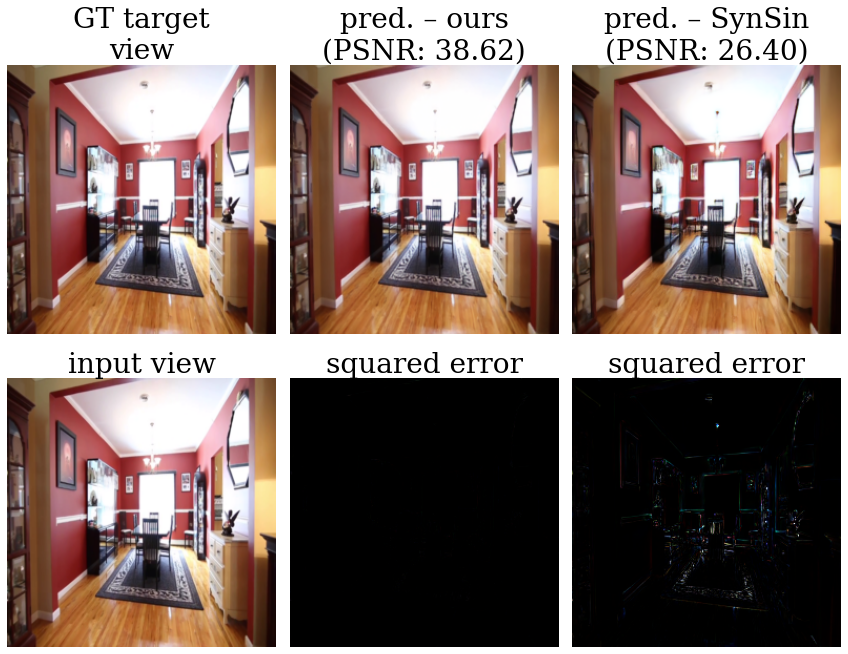

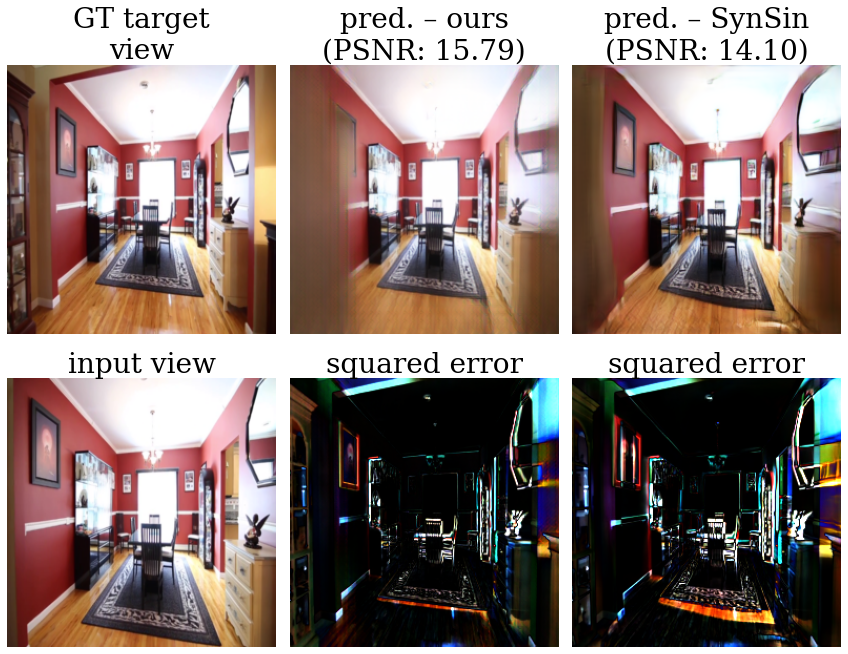

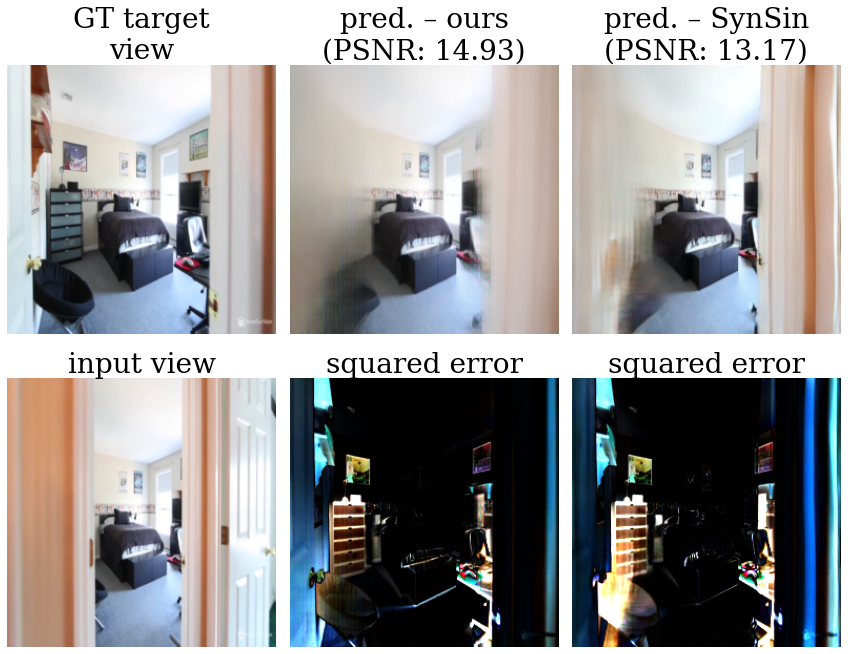

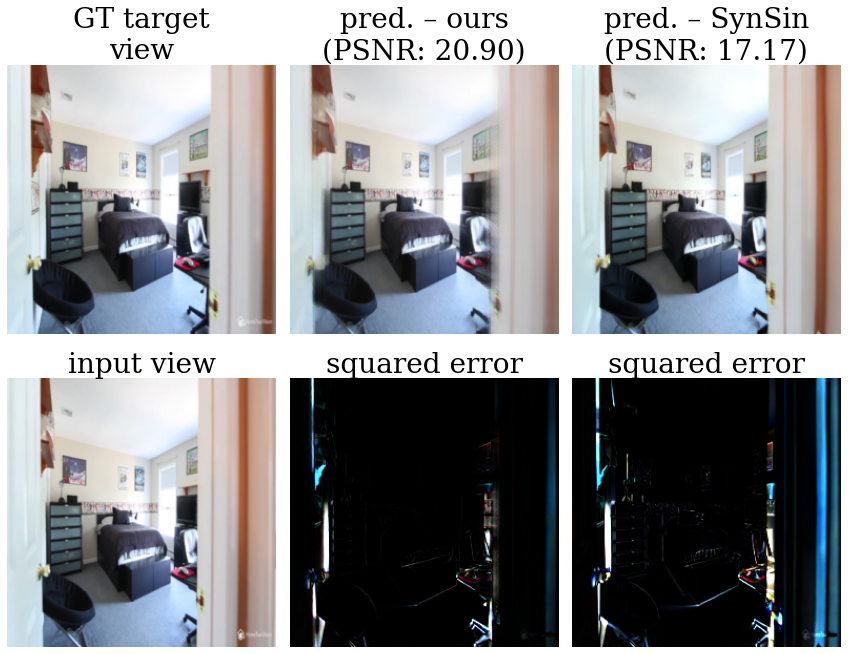

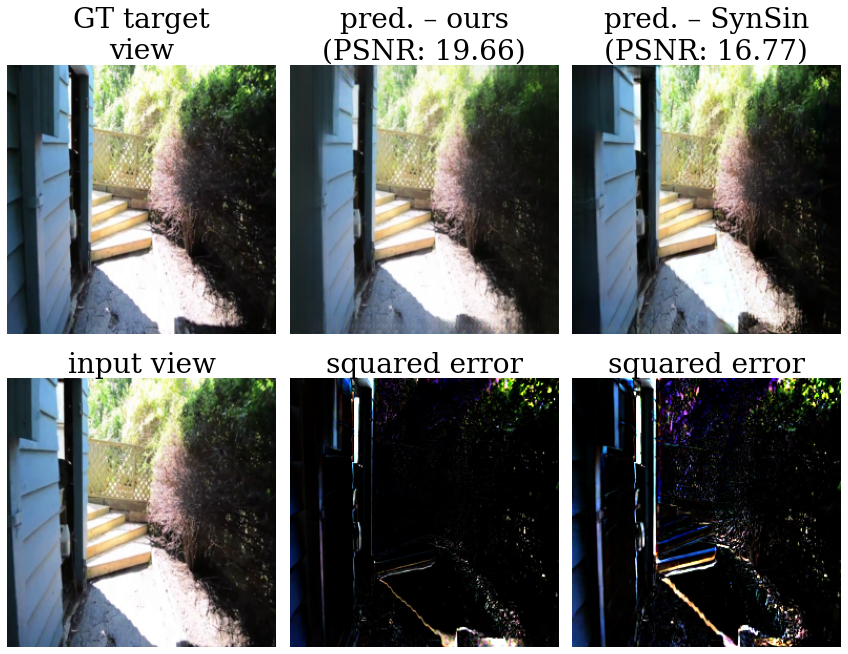

...

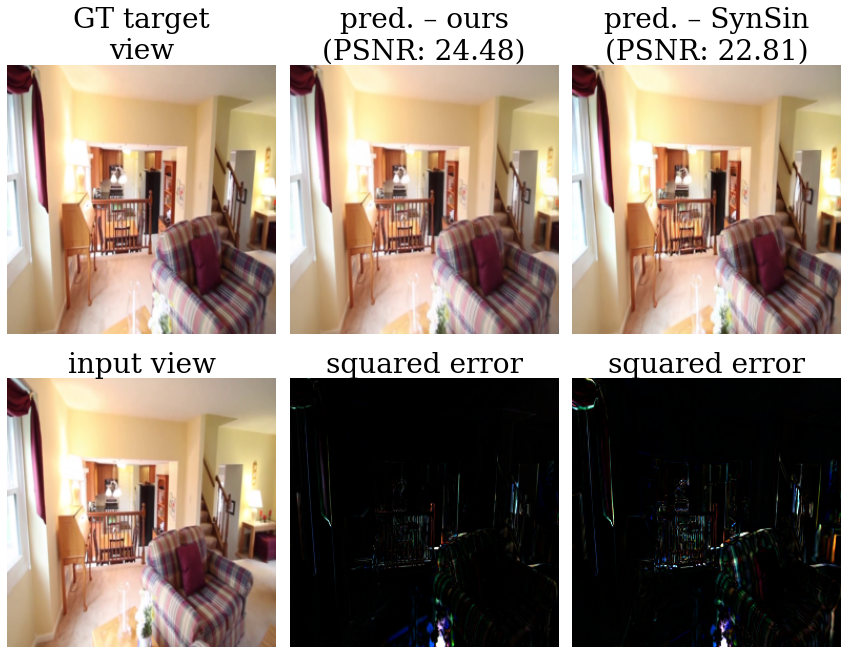

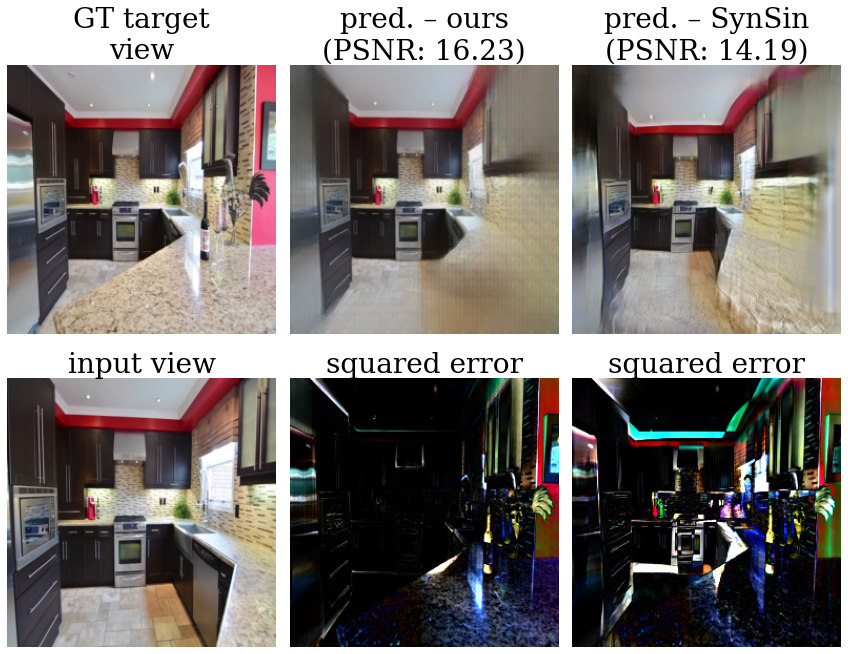

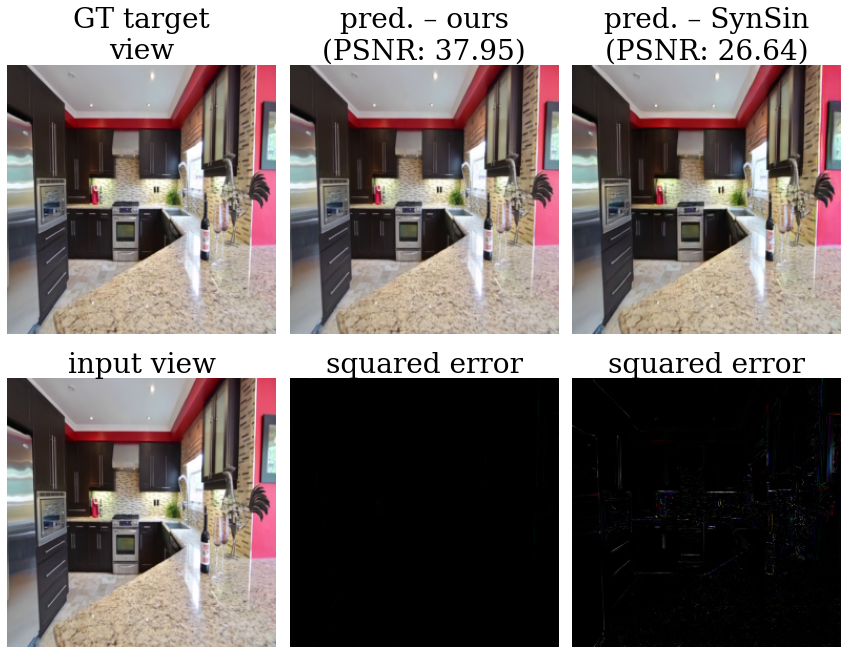

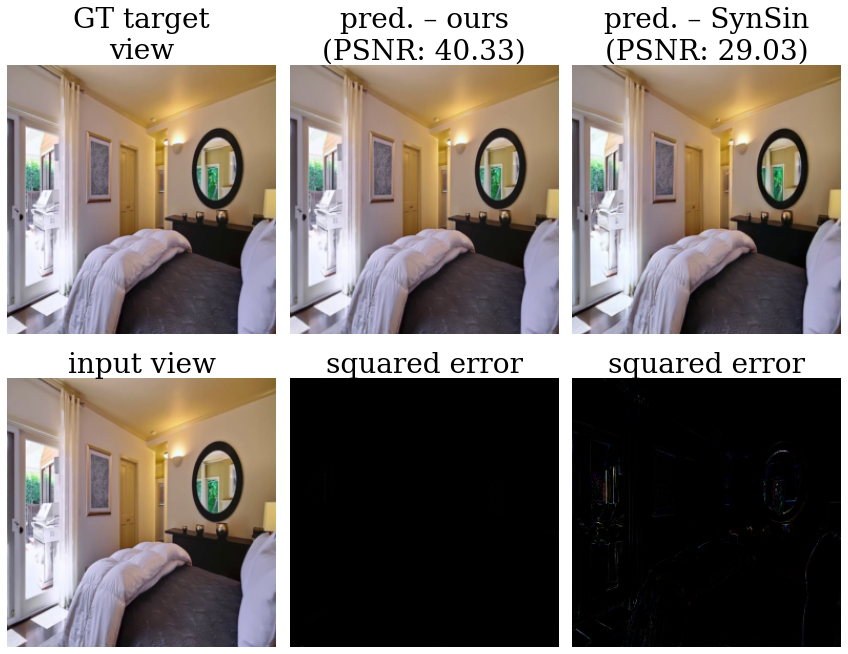

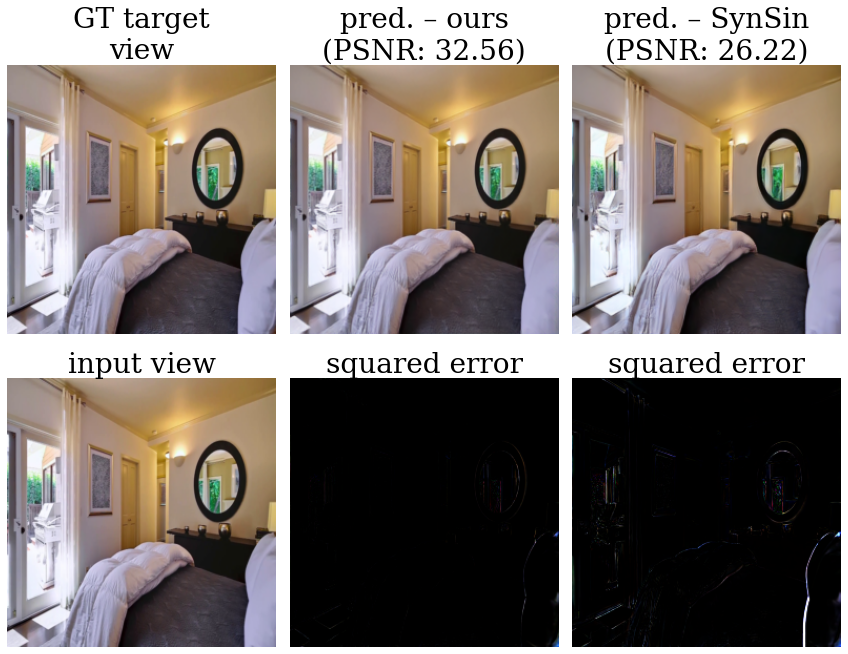

In [4]:
plt.close('all')
for idx in range(0, 20):
    ours_png_file = f'/private/home/ronghanghu/workspace/mmf_nr/save/prediction_synsin_realestate10k/{exp_name}/{n_iter}/{split}/{idx:04d}/output_image_.png'
    synsin_png_file = f"/private/home/ronghanghu/workspace/synsin/results_realestate10K_short/{idx:04d}/output_image_.png"
    input_png_file = f"/private/home/ronghanghu/workspace/synsin/results_realestate10K_short/{idx:04d}/input_image_.png"
    tgt_png_file = f"/private/home/ronghanghu/workspace/synsin/results_realestate10K_short/{idx:04d}/tgt_image_.png"

    im_ours = skimage.img_as_float32(skimage.io.imread(ours_png_file))
    im_synsin = skimage.img_as_float32(skimage.io.imread(synsin_png_file))
    im_input = skimage.img_as_float32(skimage.io.imread(input_png_file))
    im_tgt = skimage.img_as_float32(skimage.io.imread(tgt_png_file))

    plt.figure(figsize=(20, 11))
    plt.subplots_adjust(wspace=0.05)
    plt.subplots_adjust(hspace=0.10)
    plot_psnr(im_input, im_ours, im_tgt, "ours", compare=True)
    plot_psnr_compare(im_input, im_synsin, im_tgt, "SynSin")